# Binary Systems in Astrophysics WS 2021/2022

## 1 The three body problem

Not the book, but this

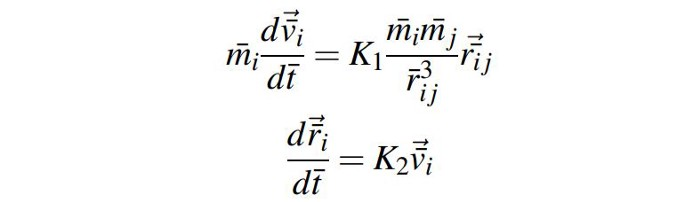

The basic idea is that, as we will see, the description from binary systems is quite well behaved and clear, but multiple-body problems do not have general closed-form solutions. Therefore their dynamical evolution is chaotic. In order to explore these complicated dynamics, we will adapt a pre-written code by G.Deshmuk (check here the original version https://towardsdatascience.com/modelling-the-three-body-problem-in-classical-mechanics-using-python-9dc270ad7767).

In [1]:
#Import scipy
import scipy as sci
#Import matplotlib and associated modules for 3D and animations
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation

We won't focus much on the equations themselves, but on exploring the parameter space itself. Therefore we will simply use this definition


In [2]:
def ThreeBodyEquations(w,t,G,m1,m2,m3):
    r1=w[:3]
    r2=w[3:6]
    r3=w[6:9]
    v1=w[9:12]
    v2=w[12:15]
    v3=w[15:18]
    r12=sci.linalg.norm(r2-r1)
    r13=sci.linalg.norm(r3-r1)
    r23=sci.linalg.norm(r3-r2)
    
    dv1bydt=K1*m2*(r2-r1)/r12**3+K1*m3*(r3-r1)/r13**3
    dv2bydt=K1*m1*(r1-r2)/r12**3+K1*m3*(r3-r2)/r23**3
    dv3bydt=K1*m1*(r1-r3)/r13**3+K1*m2*(r2-r3)/r23**3
    dr1bydt=K2*v1
    dr2bydt=K2*v2
    dr3bydt=K2*v3
    r12_derivs=np.concatenate((dr1bydt,dr2bydt))
    r_derivs=np.concatenate((r12_derivs,dr3bydt))
    v12_derivs=np.concatenate((dv1bydt,dv2bydt))
    v_derivs=np.concatenate((v12_derivs,dv3bydt))
    derivs=np.concatenate((r_derivs,v_derivs))
    return derivs

And use scipy's solver for ordinary differential equations (https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.odeint.html).

Note: It is convenient to use $K1$ and $K2$ because they will "take way" the astronomically large units that would appear otherwise. Therefore we define them as

In [3]:
#Define universal gravitation constant
G=6.67408e-11 #N-m2/kg2
#Reference quantities
m_nd=1.989e+30 #kg #mass of the sun (i.e. we scale to this mass)
r_nd=5.326e+12 #m #distance between stars in Alpha Centauri (i.e. we scale to this distance)
v_nd=30000 #m/s #relative velocity of earth around the sun (i.e. we scale to this velocities)
t_nd=79.91*365*24*3600*0.51 #s #orbital period of Alpha Centauri (i.e. we scale to this time scales)
#Net constants
K1=G*t_nd*m_nd/(r_nd**2*v_nd)
K2=v_nd*t_nd/r_nd

Now we can define the parameters of our stars

In [4]:
import numpy as np

#Mass of the First Star
m1=1.1 #First Star
#Position of the First Star
r1=[-0.5,0.5,0] #m
r1=np.array(r1,dtype="float64")
#Velocity of the First Star
v1=[0.01,0.01,0.0]
v1=np.array(v1,dtype="float64")

In [5]:
#Mass of the Second Star
m2=0.9 #Second Star
#Position of the Second Star
r2=[0.5,0,0] #m
r2=np.array(r2,dtype="float64")
#Velocity of the Second Star
v2=[-0.05,0,-0.01]
v2=np.array(v2,dtype="float64")

In [6]:
#Mass of the Third Star
m3=1.0 #Third Star
#Position of the Third Star
r3=[0,1,0] #m
r3=np.array(r3,dtype="float64")
#Velocity of the Third Star
v3=[0.0,-0.01,+0.01]
v3=np.array(v3,dtype="float64")

And conveniently, we should constructed a center of masses

In [7]:
r_com=(m1*r1+m2*r2+m3*r3)/(m1+m2+m3)
v_com=(m1*v1+m2*v2+m3*v3)/(m1+m2+m3)

Therefore the final step is to call the ordinary differential equation solver and run our little code

In [8]:
#Package initial parameters
init_params=np.array([r1,r2,r3,v1,v2,v3]) #Initial parameters
init_params=init_params.flatten() #Flatten to make 1D array
time_span=np.linspace(0,10,500) #10 orbital periods and 500 points
#Run the ODE solver
import scipy.integrate
three_body_sol=sci.integrate.odeint(ThreeBodyEquations,init_params,time_span,args=(G,m1,m2,m3))

In [9]:
#Which provides us for the three-body solutions
r1_sol=three_body_sol[:,:3]
r2_sol=three_body_sol[:,3:6]
r3_sol=three_body_sol[:,6:9]

whose results will be plotted as


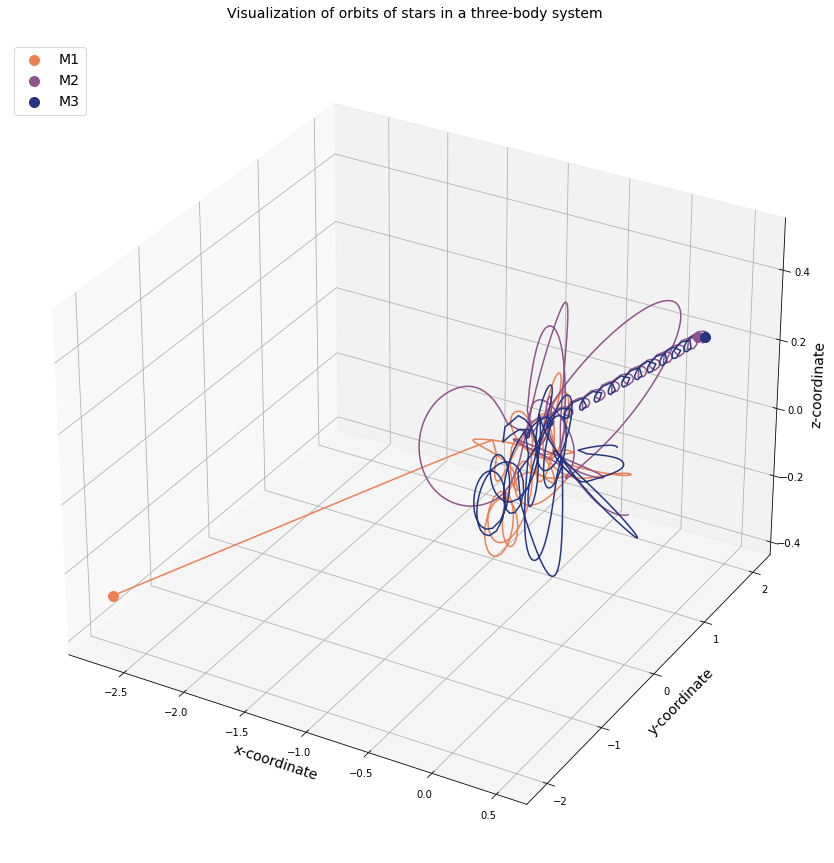

In [10]:
import matplotlib.pyplot as plt
%matplotlib inline

#Create figure
fig=plt.figure(figsize=(15,15))
#Create 3D axes
ax=fig.add_subplot(111,projection="3d")
#Plot the orbits
ax.plot(r1_sol[:,0],r1_sol[:,1],r1_sol[:,2],color="#eb8055ff")
ax.plot(r2_sol[:,0],r2_sol[:,1],r2_sol[:,2],color="#90548bff")
ax.plot(r3_sol[:,0],r3_sol[:,1],r3_sol[:,2],color="#253582ff")
#Plot the final positions of the stars
ax.scatter(r1_sol[-1,0],r1_sol[-1,1],r1_sol[-1,2],color="#eb8055ff",marker="o",s=100,label="M1")
ax.scatter(r2_sol[-1,0],r2_sol[-1,1],r2_sol[-1,2],color="#90548bff",marker="o",s=100,label="M2")
ax.scatter(r3_sol[-1,0],r3_sol[-1,1],r3_sol[-1,2],color="#253582ff",marker="o",s=100,label="M3")
#Add a few more bells and whistles
ax.set_xlabel("x-coordinate",fontsize=14)
ax.set_ylabel("y-coordinate",fontsize=14)
ax.set_zlabel("z-coordinate",fontsize=14)
ax.set_title("Visualization of orbits of stars in a three-body system\n",fontsize=14)
ax.legend(loc="upper left",fontsize=14)

In [11]:
### Creating a gif in a very, very ugly way

import os
try:
    os.mkdir('three-body-frames')
    print("The directory three-body-frames/ has been created")
except OSError as error:
    print("The directory three-body-frames/ already exists in the current folder")
    pass

frames = 100

# Generate each frame
for i in range(frames):
    n = int(i*(500/frames)) # 500 points used in the ODE solver!
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(r1_sol[:n,0],r1_sol[:n,1],r1_sol[:n,2],color="#eb8055ff")
    ax.plot(r2_sol[:n,0],r2_sol[:n,1],r2_sol[:n,2],color="#90548bff")
    ax.plot(r3_sol[:n,0],r3_sol[:n,1],r3_sol[:n,2],color="#253582ff")
    #Plot the final positions of the stars
    ax.scatter(r1_sol[n,0],r1_sol[n,1],r1_sol[n,2],color="#eb8055ff",marker="o",s=100,label="M1")
    ax.scatter(r2_sol[n,0],r2_sol[n,1],r2_sol[n,2],color="#90548bff",marker="o",s=100,label="M2")
    ax.scatter(r3_sol[n,0],r3_sol[n,1],r3_sol[n,2],color="#253582ff",marker="o",s=100,label="M3")
    #Add a few more bells and whistles
    ax.set_xlabel("x-coordinate",fontsize=14)
    ax.set_ylabel("y-coordinate",fontsize=14)
    ax.set_zlabel("z-coordinate",fontsize=14)
    ax.set_title("Visualization of orbits of stars in a three-body system\n",fontsize=14)
    ax.legend(loc="upper left",fontsize=14)
    plt.savefig(f"three-body-frames/{i}.png")
    plt.close()

The directory three-body-frames/ already exists in the current folder


In [12]:
from PIL import Image

images = [Image.open(f"three-body-frames/{n}.png") for n in range(frames)]

images[0].save('three_body.gif', save_all=True, append_images=images[1:], duration=100, loop=0)

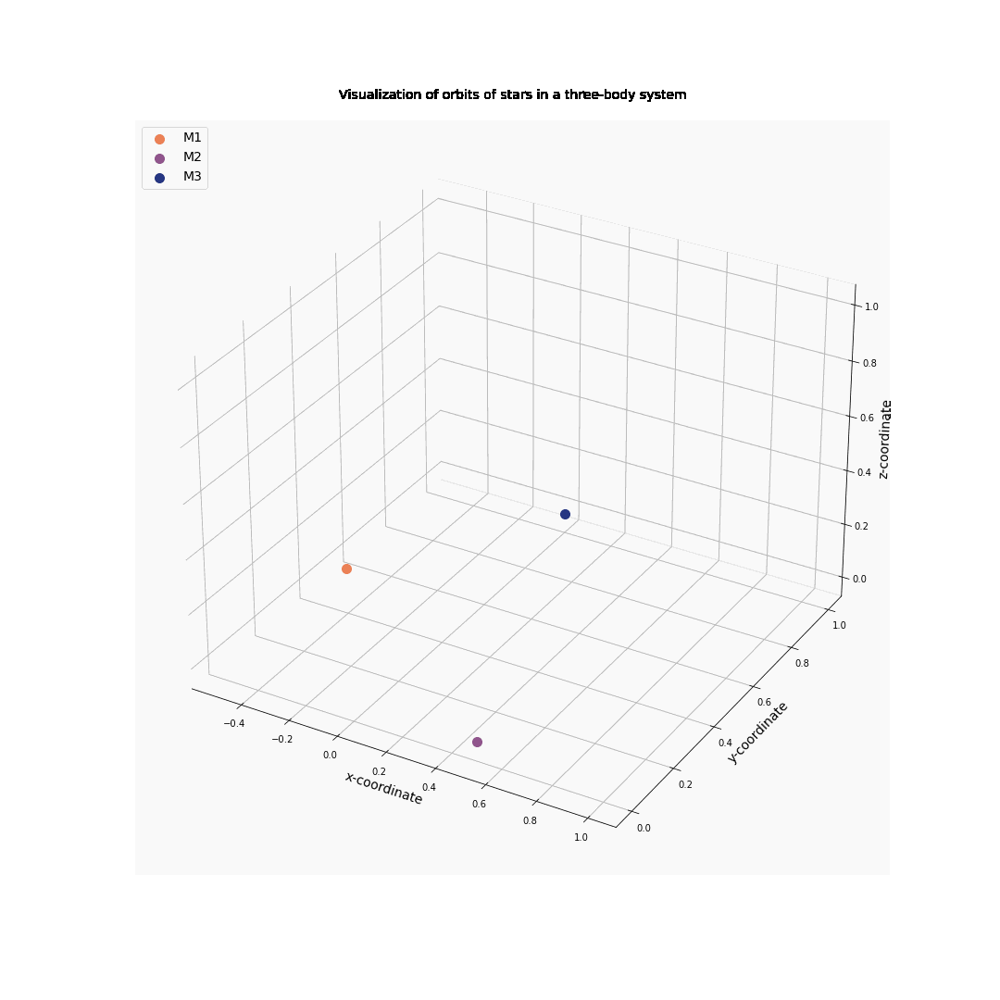